# EDA - Quality Prediction in a Mining Process

* Ciencia de Dados - IHM Stefanini
* Autor: Alisson Santiago Amaral, Cientista de dados.

> Objetivo:

* O objetivo principal é analisar e modelar os dados de medições de qualidade no processo de flotação do minério de ferro, para prever a quantidade de sílica (impureza) no concentrado de minério.

> Motivação:
* Como essa impureza é medida a cada hora, se pudermos prever quanta sílica (impureza) há no concentrado de minério, podemos ajudar os engenheiros, dando-lhes informações para que tomem decisões antecipadas. Assim, eles poderão antecipar ações corretivas (diminuir impurezas, se for o caso) e também ajudar o meio ambiente (diminuindo a quantidade de minério que vai para o rejeito à medida que você reduz a sílica no concentrado de minério).

* Ao final do projeto poderemos responder alguns questionamentos:
    - É possível prever a % de sílica concentrada a cada minuto?
    - Quantas etapas (horas) à frente podemos prever % de sílica em concentrado?
    - É possível prever % de sílica em concentrado sem a coluna de concentrado de ferro (como eles estão altamente correlacionados)?

> Fonte:

* https://www.kaggle.com/datasets/edumagalhaes/quality-prediction-in-a-mining-process

## Planejamento:

> Prazo: 3 semanas
* 09/03/2023 a 30/03/2023

> Cronograma:

<img src="./imagens/cronograma.png" width = "700" />


> Repositório do GitHub:
* 

## Sumário:

0. Introdução

        0.1 Minério de ferro e o processo de flotação
        0.2 Dataset
            0.2.1 Imports das bibliotecas e dataset
            0.2.2 Dicionário dos dados
1. Análise Exploratória dos Dados

        1.1 Pré-processamento e análise exploratória
            1.1.1 Análise Inicial
            1.1.2 Distribuição e Outliers
            1.1.3 Ruídos
            1.1.4 Correlação
        1.2 Série Temporal
            1.2.1 Trend e Sazonalidade

2. Conclusão

        2.1 Insights
3. Referências


# 0. Introdução

## 0.1 Minério de ferro e o processo de flotação

> Conceitos Gerais:
* A mineração de ferro é uma das principais atividades econômicas do Brasil, e para atender as exigências de teor de ferro do mercado o minério precisa passar por um processo de concentração. A flotação é a técnica mais difundida para concentrar o minério de ferro que possui teores cada vez mais baixos. Esta técnica consiste em separar partículas com propriedades de superfície induzidas e possui dois requisitos básicos: as partículas devem estar liberadas e dentro de uma granulometria adequada. Para garantir que estes requisitos sejam atendidos é preciso um controle eficaz do processo. [Diniz Maíra Santana, 2013]

> Flotação:
* A flotação é um processo de concentração que separa partículas sólidas explorando diferenças nas características de superfícies entre as várias espécies de minerais presentes.

<img src="./imagens/flotacao-1.png" width = "250" />

*  A célula consiste de um tanque com agitador que mantém a polpa de minério em suspensão. O eixo do agitador é feito de estrutura tubular e, à medida que gira, cria um vácuo e o ar tende a entrar na célula através do eixo, também existem células onde o ar é bombeado para dentro das mesmas. as partículas hidrofóbicas aderem às bolhas e são arrastadas para cima, saindo pelas calhas de flotado da célula, na região superior. As bolhas formam uma camada de espuma na parte superior da célula. As partículas hidrofílicas se mantêm em suspensão na polpa, saindo lateralmente na abertura próxima ao fundo do tanque. A alimentação de polpa na célula é realizada na extremidade oposta à da saída, igualmente junto ao fundo do tanque [GUIMARÃES, 1995]


* Fonte: "Instrumentação e Controle no Processo de Flotação Convencional de Minério de Ferro, Maíra Santana Diniz"

## 0.2 Dataset

### 0.2.1 Imports

In [1]:
#Importando as bibliotecas
import pandas as pd
import numpy as np

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
from plotly_resampler import FigureResampler
import seaborn as sns
import matplotlib.pyplot as plt


from sklearn.preprocessing import StandardScaler, MinMaxScaler
import statsmodels.api as sm
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller, kpss

%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_columns', None)

In [2]:
# Carregando os dados
df= pd.read_csv('./Dataset/MiningProcess_Flotation_Plant_Database.csv', decimal=",", 
                    parse_dates=["date"], infer_datetime_format=True)

# linhas e colunas
print('Linhas: ' + str(df.shape[0]))
print('Colunas: '+ str(df.shape[1]))

# Prévia
df.head(2)

Linhas: 737453
Colunas: 24


,date,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,Flotation Column 04 Air Flow,Flotation Column 05 Air Flow,Flotation Column 06 Air Flow,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
0,2017-03-10 01:00:00,55.2,16.98,3019.53,557.434,395.713,10.0664,1.74,249.214,253.235,250.576,295.096,306.4,250.225,250.884,457.396,432.962,424.954,443.558,502.255,446.370,523.344,66.91,1.31
1,2017-03-10 01:00:00,55.2,16.98,3024.41,563.965,397.383,10.0672,1.74,249.719,250.532,250.862,295.096,306.4,250.137,248.994,451.891,429.560,432.939,448.086,496.363,445.922,498.075,66.91,1.31


### 0.2.2 - Dicionário dos dados

> **date:** *Data e hora da medição - 10/03/2017 a 09/09/2017*

> **% Iron Feed:** *Percentual de Ferro proveniente do minério que está sendo alimentado nas células de flotação.*

> **% Silica Feed:** *Percentual de sílica (impureza) proveniente do minério de ferro que está sendo alimentado nas células de flotação.*

> **Starch Flow:** *Fluxo de Amido (reagente) -> m³/h.*

> **Amina Flow:** *Fluxo de Amina (reagente) -> m³/h.*

> **Ore Pulp Flow:** *Fluxo da polpa de Minério -> t/h.*

> **Ore Pulp pH:** *PH da polpa de Minério -> 0 a 14.*

> **Ore Pulp Density:** *Densidade da polpa de Minério -> 1 a 3 kg/cm³.*

> **Flotation Column (01 - 07) Air Flow:** *Fluxo de ar que entra na célula de flotação -> Nm³/h.*

> **Flotation Column (01 - 07) Level:** *Nível de Espuma na célula de flotação -> mm.*

> **% Iron Concentrate:** *Percentual de Ferro presente no minério de ferro após a flotação -> 0 a 100%, medição de laboratório.*

> **% Silica Concentrate:** *Percentual de Sílica (impureza) presente no minério após a flotação -> 0 a 100%, medição de laboratório.*

# 1. Análise Exploratoria dos Dados

## 1.1 Pré-processamento e análise exploratória

In [3]:
# Vamos aplicar algumas normas de Clean Code nos nomes das colunas:
df.columns= df.columns.str.lower() # Todas as letras minúsculas
df.columns = df.columns.str.replace(' ','_') # Eliminar os espaços
df.columns = df.columns.str.replace('%','per') # Retirar os simbolos de %
df.columns = df.columns.str.replace('flotation_','') # Reduzir nomes longos

# Prévia
#df.head(10)
df.head(2)

,date,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
0,2017-03-10 01:00:00,55.2,16.98,3019.53,557.434,395.713,10.0664,1.74,249.214,253.235,250.576,295.096,306.4,250.225,250.884,457.396,432.962,424.954,443.558,502.255,446.370,523.344,66.91,1.31
1,2017-03-10 01:00:00,55.2,16.98,3024.41,563.965,397.383,10.0672,1.74,249.719,250.532,250.862,295.096,306.4,250.137,248.994,451.891,429.560,432.939,448.086,496.363,445.922,498.075,66.91,1.31


> **date:** *date*

> **% Iron Feed:** *per_iron_feed*

> **% Silica Feed:** *per_silica_feed*

> **Starch Flow:** *starch_flow*

> **Amina Flow:** *amina_flow*

> **Ore Pulp Flow:** *ore_pulp_flow*

> **Ore Pulp pH:** *ore_pulp_ph*

> **Ore Pulp Density:** *ore_pulp_density*

> **Flotation Column (01 - 07) Air Flow:** *column_X_air_flow*

> **Flotation Column (01 - 07) Level:** *column_X_level*

> **% Iron Concentrate:** *per_iron_concentrate*

> **% Silica Concentrate:** *per_silica_concentrate*

> Observações:
* A coluna "date" não conta os segundos, isso é um problema visto que, segundo a fonte, algumas colunas foram amostradas a cada 20 segundos e outras foram amostrados em uma base horária.

* Os valores de "% Iron Feed", "% Silica Feed", "% Iron Concentrate" e "% Silica Concentrate" se repetem em seguidas linhas, o que pode demonstrar que essas colunas são medidas em uma periodicidade diferente das outras. Iremos investigar! (Essa análise contou com a Ajuda do EXCEL)

* Outra dúvida inicial é se iremos tratar os dados com uma metodologia de série temporal e aplicar o métodos relacionado a esse tipo de dado, ou se iremos seguir as análises no método convencional, tratando cada linha como uma medição independente. Para isso iremos investigar se os dados medidos têm uma periodicidade consistente, sazonalidade e etc.

> Próximos passos:

* Análise descritiva e limpeza de dados


### 1.1.1 Analise inicial

Verificando Null values e o tipo de cada dado

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 737453 entries, 0 to 737452
Data columns (total 24 columns):
 #   Column                  Non-Null Count   Dtype         
---  ------                  --------------   -----         
 0   date                    737453 non-null  datetime64[ns]
 1   per_iron_feed           737453 non-null  float64       
 2   per_silica_feed         737453 non-null  float64       
 3   starch_flow             737453 non-null  float64       
 4   amina_flow              737453 non-null  float64       
 5   ore_pulp_flow           737453 non-null  float64       
 6   ore_pulp_ph             737453 non-null  float64       
 7   ore_pulp_density        737453 non-null  float64       
 8   column_01_air_flow      737453 non-null  float64       
 9   column_02_air_flow      737453 non-null  float64       
 10  column_03_air_flow      737453 non-null  float64       
 11  column_04_air_flow      737453 non-null  float64       
 12  column_05_air_flow      737453

In [5]:
df['date']

0        2017-03-10 01:00:00
1        2017-03-10 01:00:00
2        2017-03-10 01:00:00
3        2017-03-10 01:00:00
4        2017-03-10 01:00:00
                 ...        
737448   2017-09-09 23:00:00
737449   2017-09-09 23:00:00
737450   2017-09-09 23:00:00
737451   2017-09-09 23:00:00
737452   2017-09-09 23:00:00
Name: date, Length: 737453, dtype: datetime64[ns]

In [6]:
# Contando Null values
df.isnull().sum()

date                      0
per_iron_feed             0
per_silica_feed           0
starch_flow               0
amina_flow                0
ore_pulp_flow             0
ore_pulp_ph               0
ore_pulp_density          0
column_01_air_flow        0
column_02_air_flow        0
column_03_air_flow        0
column_04_air_flow        0
column_05_air_flow        0
column_06_air_flow        0
column_07_air_flow        0
column_01_level           0
column_02_level           0
column_03_level           0
column_04_level           0
column_05_level           0
column_06_level           0
column_07_level           0
per_iron_concentrate      0
per_silica_concentrate    0
dtype: int64

Corrigindo o range de data, computando os segundos

> Observações:
* Nenhum Null value encontrado
* Os formatos dos dados estão corretos
* Mas surgiu a dúvida se os dados estão sequenciais.

> Próximos passos:
* Vamos contar a quantidade de linhas.
* Se temos medições a cada 20 segundos, dentro de uma hora deveremos ter 180 medições(linhas). Com isso iremos agrupar e contar a quantidade de registros de cada coluna dentro de 1 hora e assim identificar se ocorreram gaps dentro do dataset.

In [7]:
# Contando a quantidade de registros a cada hora
df_hora = df.groupby('date').count()
df_hora.loc[df_hora['per_silica_concentrate'] < 180,:]

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date,,,,,,,,,,,,,,,,,,,,,,,
2017-03-10 01:00:00,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174,174
2017-04-10 00:00:00,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179,179


> Observações:
* Como suspeitado anteriormente existem medições faltantes, no primeiro mês de dado e no dia 10-04-2017 00:00:00.
* Esse tipo de análise não nos dá a certeza que as medições foram feitas em todos os horários e dias seguidos.

> Próximo Passo:
* Iremos realizar uma análise visual, plotando cada coluna e verificando.
* Teremos que corrigir o range de data para termos contagem dos segundos. 
* Iremos utilizar um código encontrado no Kaggle, feito por MARK KOERNER, Link: https://www.kaggle.com/code/mkoerner1/iron-mining-production-prediction


In [8]:
# Código adaptado do Kaggle: https://www.kaggle.com/code/mkoerner1/iron-mining-production-prediction
 
horas = pd.Series(df['date'].unique())
horas.index = horas

index_segundos = pd.date_range(start='2017-03-10 01:00:00', end='2017-09-09 23:59:40', freq='20S')[6:]

horas_lista = horas.index.format()

segundos_lista = index_segundos.format()

novo_index = []
for idx in segundos_lista:
    if (idx[:13] + ':00:00') in horas_lista:
        novo_index.append(idx)

#remove the one missing interval within the hour which we found earlier using the counts
novo_index.remove('2017-04-10 00:00:00')

novo_index[3]

'2017-03-10 01:03:00'

In [9]:
df['date_second'] = pd.to_datetime(novo_index)
df.index = df['date_second']
df = df.loc[:, df.columns[:-1]]
df.rename(columns={'date': 'Date Hour'}, inplace=True)

df.iloc[173:176,:]

,Date Hour,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date_second,,,,,,,,,,,,,,,,,,,,,,,,
2017-03-10 01:59:40,2017-03-10 01:00:00,55.2,16.98,3147.27,540.131,391.406,10.1595,1.67014,249.269,245.610,248.566,295.096,306.4,250.291,248.873,450.139,486.288,455.219,441.813,462.989,494.026,481.052,66.91,1.31
2017-03-10 02:00:00,2017-03-10 02:00:00,55.2,16.98,3170.41,539.673,399.697,10.1589,1.66910,249.291,248.269,248.313,295.096,306.4,250.488,249.774,462.601,488.724,441.674,433.629,448.477,480.866,489.382,67.06,1.11
2017-03-10 02:00:20,2017-03-10 02:00:00,55.2,16.98,3208.30,544.922,397.529,10.1584,1.66807,250.115,252.070,248.148,295.096,306.4,250.488,251.598,468.357,493.623,442.700,445.156,434.102,451.634,470.266,67.06,1.11


> Observações:
* Após ajustar e adicionar um index agora com a contagem correta dos segundos, iremos criar um Dataframe com o range de datas e após isso fazer um merge entre os 2 dataframes pela data. A intenção é identificar possíveis dias e horas sem dados.

In [10]:
df_date = pd.DataFrame(index_segundos, columns=['date_second'])

df_full = pd.merge(df_date,df, how='left', on='date_second')

df_full['date_second'] = pd.to_datetime(df_full['date_second'])

df_full = df_full.drop('Date Hour', axis=1)

df_full.rename(columns={'date_second': 'date'}, inplace=True)


del df_date
del df_hora
del horas
del horas_lista
del idx
del index_segundos
del segundos_lista

In [11]:
#register_plotly_resampler(mode="auto", default_n_shown_samples=4500)

In [12]:
df_full.head(10)

,date,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
0,2017-03-10 01:02:00,55.2,16.98,3019.53,557.434,395.713,10.0664,1.74,249.214,253.235,250.576,295.096,306.4,250.225,250.884,457.396,432.962,424.954,443.558,502.255,446.370,523.344,66.91,1.31
1,2017-03-10 01:02:20,55.2,16.98,3024.41,563.965,397.383,10.0672,1.74,249.719,250.532,250.862,295.096,306.4,250.137,248.994,451.891,429.560,432.939,448.086,496.363,445.922,498.075,66.91,1.31
2,2017-03-10 01:02:40,55.2,16.98,3043.46,568.054,399.668,10.0680,1.74,249.741,247.874,250.313,295.096,306.4,251.345,248.071,451.240,468.927,434.610,449.688,484.411,447.826,458.567,66.91,1.31
3,2017-03-10 01:03:00,55.2,16.98,3047.36,568.665,397.939,10.0689,1.74,249.917,254.487,250.049,295.096,306.4,250.422,251.147,452.441,458.165,442.865,446.210,471.411,437.690,427.669,66.91,1.31
4,2017-03-10 01:03:20,55.2,16.98,3033.69,558.167,400.254,10.0697,1.74,250.203,252.136,249.895,295.096,306.4,249.983,248.928,452.441,452.900,450.523,453.670,462.598,443.682,425.679,66.91,1.31
5,2017-03-10 01:03:40,55.2,16.98,3079.10,564.697,396.533,10.0705,1.74,250.730,248.906,249.521,295.096,306.4,250.356,251.873,444.384,443.269,460.449,439.920,451.588,433.539,425.458,66.91,1.31
6,2017-03-10 01:04:00,55.2,16.98,3127.79,566.467,392.900,10.0713,1.74,250.313,252.202,249.082,295.096,306.4,250.950,253.477,446.185,444.571,452.306,431.328,443.548,444.575,431.251,66.91,1.31
7,2017-03-10 01:04:20,55.2,16.98,3152.93,558.777,397.002,10.0722,1.74,249.895,253.630,249.258,295.096,306.4,249.456,253.345,445.985,461.341,461.640,442.067,441.730,461.770,449.679,66.91,1.31
8,2017-03-10 01:04:40,55.2,16.98,3147.27,556.030,394.307,10.0730,1.74,250.137,251.104,248.774,295.096,306.4,248.577,250.884,446.686,478.385,459.103,455.074,439.798,457.738,455.915,66.91,1.31
9,2017-03-10 01:05:00,55.2,16.98,3142.58,565.857,393.105,10.0738,1.74,249.653,252.202,248.203,295.096,306.4,248.511,248.137,445.685,478.779,460.665,457.225,453.236,449.898,455.750,66.91,1.31


In [13]:
df_full.columns[1:].shape

(23,)

In [14]:
fig = FigureResampler(make_subplots(rows=24, cols=1, subplot_titles=df_full.columns[1:]))
j = 1
for i in df_full.columns[1:]:
    fig.add_trace(
        go.Scatter(
            {'x': df_full['date'], 
             'y': df_full[i]}, mode='lines+markers', marker_symbol='circle', marker_size=4), 
             row=j, col=1)
    j += 1

fig.update_layout(height = 3500,title = "Stacked Line Plots", showlegend=False, 
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")
fig.update_yaxes(showgrid=False)
fig.update_xaxes(showgrid=False)

fig.show()

> Observações:

* Dados bastante ruidosos, o que já era esperado, visto que o processo é dinâmico com entradas e saídas como fluxo de ar e adição de reagentes.

* Alguns motivos dos ruídos: 
    - Variáveis com medição de vazão(flow): Amina_flow, Starch_flow e Air_flow -> A dinâmica de abertura e fechamento das válvulas.
    - Variáveis de níveis(level): Column level -> a formação da espuma caixa agitação e dificulta a medição dos sensores.

In [15]:
# Create fig
fig = FigureResampler(go.Figure())

# Add traces
fig.add_trace(
    go.Scatter(x=df_full['date'], y=df_full['per_silica_concentrate'], name='% Silica Concentrate', mode='lines')
)

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>")
fig.show()

> Observações:

* Surgiu uma dúvida sobre a periodicidade das variáveis '% Iron Feed', '% Silica Feed' pois parecem não serem medidas a cada 20 segundo ou 1 hora.

> Próximo Passo:
* Vamos investigar a quantidade de valores únicos dentro de cada dia.

In [16]:
df_full = df_full.set_index('date')
df_full = df_full.dropna()

# df_full.to_csv('df_full.csv', encoding='utf-8', sep=';')

In [17]:
# Identificando horários de entrada de dados das variáveis % Iron Feed e % Silica Feed.

# df_full.drop_duplicates(subset=['% Silica Feed']).head(10)
df_full.drop_duplicates(subset=['per_iron_feed']).iloc[3:,:].head(10)

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date,,,,,,,,,,,,,,,,,,,,,,,
2017-03-11 01:00:00,60.66,8.25,5401.560000,340.698,408.574000,10.21640,1.65959,248.423,252.466,251.807,295.096,306.4,249.521,250.093,545.232,556.440000,542.358,203.945000,459.348000,546.732000,453.326000,67.44,1.17
2017-03-11 07:00:00,59.89,8.98,2514.940000,329.865,395.947000,9.70634,1.64552,248.950,249.258,248.950,295.096,306.4,248.895,249.313,550.737,546.045000,534.156,635.627000,608.507000,543.204000,648.733000,63.33,4.96
2017-03-11 16:00:00,59.66,9.09,3752.440000,546.875,416.367000,9.73503,1.75010,247.632,245.215,248.071,295.096,306.4,251.147,247.192,582.068,828.599547,568.690,549.220000,532.050000,565.660000,523.620000,65.58,2.36
2017-03-12 01:00:00,58.84,11.46,307.031000,542.053,401.016000,9.88076,1.74205,248.818,252.334,249.807,295.096,306.4,250.247,249.829,434.023,440.042000,438.011,463.319000,462.824000,443.402000,433.133000,64.29,3.62
2017-03-12 07:00:00,58.82,11.46,3302.730000,568.848,413.192545,9.95299,1.75000,251.367,253.125,248.950,295.096,306.4,250.488,247.412,460.950,458.790000,442.970,164.486603,423.000000,437.410000,429.270000,65.90,2.40
2017-03-12 16:00:00,59.05,11.20,2946.880000,537.537,401.602000,9.74623,1.73804,251.982,252.510,250.005,295.096,306.4,249.983,250.203,503.691,505.800000,495.041,446.597000,461.169000,450.346000,457.850000,66.55,1.44
2017-03-13 01:00:00,57.35,12.27,2373.648393,391.113,397.808000,9.08293,1.57954,251.598,251.235,248.071,295.096,306.4,248.939,249.500,564.776,393.536000,584.711,509.353000,185.657913,692.685588,179.623000,66.24,1.04
2017-03-13 07:00:00,56.42,12.99,1732.322789,428.162,390.674000,9.98218,1.74000,247.412,251.477,248.950,295.096,306.4,249.170,250.818,568.304,220.805446,541.705,678.244000,596.775000,560.900000,635.073437,66.50,2.03
2017-03-13 16:00:00,58.95,8.94,4117.970000,329.712,392.109000,10.06790,1.73383,251.960,248.379,247.896,295.096,306.4,249.829,250.049,565.251,441.170000,570.463,527.848000,559.541000,541.916000,536.751000,65.49,1.90


In [18]:
# Quantidade de registros no dia
df_full.loc['2017-03-10 00:00:00':'2017-03-10 23:59:40',['per_iron_feed', 'per_silica_feed']].value_counts()

per_iron_feed  per_silica_feed
54.95          17.40              1620
55.99          17.16              1440
55.20          16.98              1074
dtype: int64

> Observações:
* A suspeita foi confirmada, as variáveis 'per_iron_feed', 'per_silica_feed' são medidas 3 vezes ao dia - > 01, 07, 16

* Periodicidade dos dados:
    * 'per_iron_feed', 'per_silica_feed' - > 3 vezes ao dia - 01, 07, 16 horas;
    * 'per_iron_concentrate', 'per_silica_concentrate' - > A cada 1 hora - 00h;
    * Starch Flow', 'Amina Flow', 'Ore_pulp_Flow', 'Ore_pulp_pH', 'ore_pulp_density', column_X_air_flow, column_X_level -> A cada 20 segundos.


* Analisando os subplots das variáveis, foi possível identificar:
    * Descontinuidade no período entre 17/03/2017 a 29/03/2017;
    * Diferentes Periodicidades;
    * Possível interpolação e/ou preenchimento de dados faltantes em algumas variáveis;
    * 'per_iron_feed', 'per_silica_feed' tem grandes períodos com repetição de valores únicos, o que deixa um questionamento sobre como a alimentação do minério funciona. 

> **Importante:**

* Considero primordial uma discussão e amadurecimento sobre processo, sabendo que o mesmo é dinâmico e depende das condições da operação, marcar uma reunião com os responsáveis pela operação será de grande ajuda.

* Surgiu dúvidas que podem ser muito importantes para o decorrer das análises:
    * A produção foca na obtenção de ferro para qual fim ? ferro gusa para produção de aço ?
    * Qual o teor de sílica aceitável ?
* Considerando que o nosso target possui medições a cada hora, iremos reduzir o nosso dataset e considerar as primeiras medições a cada hora.
* Considerando que existem variáveis medidas a cada 20 segundos, para essa variável iremos calcular a média dentro do intervalo de cada hora.

* Resample

In [19]:
df_hour = df_full.resample('H').mean()
df_hour = df_hour.dropna()

# apenas dados a partir do dia 29-03-2017
df_hour = df_hour.loc['2017-03-29 19:00:00':,:]

df_hour = df_hour.round(2)

# Estatística básica
df_hour.describe()

# Salvar os dados horários para futuras aplicações
#df_hour.to_csv('df_hour.csv', encoding='utf-8', sep=';')

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
count,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000,3941.000000
mean,56.213755,14.777262,2849.561345,488.888026,397.467036,9.769810,1.679218,281.431949,278.328840,282.399287,299.620332,299.661266,293.736788,292.368582,519.861332,522.737447,531.572360,418.055461,422.721149,426.939675,418.063540,65.025415,2.322842
std,5.233468,6.890152,947.651856,83.715921,8.498362,0.378351,0.063424,29.186852,29.309752,28.055135,2.311080,3.133057,28.945574,26.491313,123.131638,116.253880,139.925422,76.179364,74.666280,74.766775,71.682562,1.108786,1.119399
min,42.740000,1.310000,54.600000,242.930000,376.840000,8.750000,1.520000,175.890000,178.190000,177.200000,293.340000,287.060000,196.510000,199.730000,181.930000,224.910000,135.210000,165.730000,214.740000,203.700000,185.060000,62.050000,0.600000
25%,52.610000,8.790000,2151.350000,436.550000,398.770000,9.540000,1.650000,250.110000,250.120000,250.110000,299.800000,299.670000,299.210000,299.050000,408.720000,449.180000,402.140000,351.260000,350.830000,353.150000,350.730000,64.350000,1.440000
50%,55.940000,14.200000,2883.660000,502.840000,399.840000,9.800000,1.700000,299.850000,299.600000,299.890000,299.920000,299.910000,299.890000,299.880000,499.560000,499.830000,499.560000,400.820000,400.600000,402.690000,400.480000,65.190000,2.000000
75%,59.720000,20.140000,3515.180000,550.260000,400.590000,10.030000,1.720000,299.960000,299.990000,299.950000,299.990000,300.090000,300.110000,300.130000,599.830000,599.410000,600.290000,494.920000,497.330000,491.070000,454.570000,65.820000,3.000000
max,65.780000,33.400000,6270.160000,736.980000,418.070000,10.810000,1.820000,312.300000,309.890000,302.780000,305.600000,307.010000,354.980000,351.270000,859.030000,827.780000,884.830000,675.630000,674.070000,698.510000,655.500000,68.010000,5.530000


In [20]:
df_hour.loc[:,['per_iron_concentrate', 'per_silica_concentrate']]

,per_iron_concentrate,per_silica_concentrate
date,,
2017-03-29 19:00:00,66.28,1.69
2017-03-29 20:00:00,64.13,1.81
2017-03-29 21:00:00,65.88,1.71
2017-03-29 22:00:00,64.69,2.92
2017-03-29 23:00:00,65.85,2.00
...,...,...
2017-09-09 19:00:00,65.05,1.65
2017-09-09 20:00:00,64.83,1.71
2017-09-09 21:00:00,64.29,1.80


In [21]:
df_hour.loc[:,['per_iron_feed', 'per_silica_feed', 'per_iron_concentrate', 'per_silica_concentrate'	]].describe(percentiles=[0.05,0.25,0.50,0.75,0.95])

,per_iron_feed,per_silica_feed,per_iron_concentrate,per_silica_concentrate
count,3941.000000,3941.000000,3941.000000,3941.000000
mean,56.213755,14.777262,65.025415,2.322842
std,5.233468,6.890152,1.108786,1.119399
min,42.740000,1.310000,62.050000,0.600000
5%,48.070000,6.260000,62.860000,1.090000
25%,52.610000,8.790000,64.350000,1.440000
50%,55.940000,14.200000,65.190000,2.000000
75%,59.720000,20.140000,65.820000,3.000000
95%,64.030000,26.910000,66.570000,4.720000
max,65.780000,33.400000,68.010000,5.530000


> Observações:

* A média do percentual de Sílica (per_silica_feed) é de 14.66% enquanto o percentual do concentrado de sílica resultante do processo (per_silica_concentrate) é de 2.33%, uma queda considerável de teor de SiO2(12.3%), o valor médio de per_silica_concentrate está bem próximo dos padrões de teor de SiO2 exigidos por grandes empresas para produção de aço por exemplo. Porém é possível notar que a dinâmica do processo tem o objetivo de manter o teor de SiO2 aproximadamente abaixo dos 5 %(valor máximo do concentrado final).

* A média da % de ferro alimentado(per iron feed) foi de aproximadamente 56.3% enquanto que o % de ferro resultante(per iron concentrate) foi de 65.0%, um ganho de 8.7% no concentrado de ferro no final do processo.
* A variável target varia de 0.6 a 5.5 e tem um desvio padrão de 1.12. a diferença da média e mediana é de 3.22.
* As variáveis de Air Flow e Level apresentam em geral um desvio padrão alto, com exceção de Flotation column_04_air_flow e column_05_air_flow. Porém os desvios das variáveis de Air flow são em geral bem menores que os valores de desvios de Level. Os valores de desvio padrão indicam alta dispersão de dados em relação a média.

* Eficiência média do período:

        - Índice de Concentração de Ferro (Fe): Esse índice é calculado dividindo-se a concentração de ferro no produto final pela concentração de ferro no minério bruto e multiplicando-se por 100.
        - Índice de Concentração de Ferro médio do período foi de 115.45 %

* Vazão de massa : A vazão mássica é a quantidade de massa de sólidos que está sendo transportada pela polpa em um determinado intervalo de tempo. Pode ser calculada multiplicando as variáveis ore_pulp_flow e ore_pulp_density e é medida em t/h.

        - A vazão mássica média do período é de 675.92 t/h de minério.

> **Próximo passo:**
* Cálculo da vazão mássica por hora, multiplicando a densidade da polpa e o fluxo da polpa (ore_pulp_flow e ore_pulp_density) - t/h
* Vamos plotar todas as variáveis e analisar a dispersão dos dados.

In [22]:
# df_hour['mass_flow'] = ['ore_pulp_density'] * df_hour['ore_pulp_flow']

In [23]:
fig_2 = FigureResampler(make_subplots(rows=25, cols=1, subplot_titles=df_hour.columns),default_n_shown_samples=1000)
j = 1
for i in df_hour.columns:
    fig_2.add_trace(
        go.Scatter(
            {'x': df_hour.index,
             'y': df_hour[i]}, mode='lines+markers', marker_symbol='circle', marker_size=4), 
             row=j, col=1)
    j += 1
fig_2.update_layout(height = 3500,title = "Stacked Line Plots", showlegend=False, 
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")
fig_2.update_yaxes(showgrid=False)
fig_2.update_xaxes(showgrid=False)


fig_2.show()

> Observações:
* O resample do dataset para dados horários, trouxe uma "limpeza", deixando a série mais clara e revelando padrões de comportamento, como o caso da Column_02_air_flow e ore_pulp_flow, etc. Acredito que utilizar os dados horários e realizar uma média do período foi a escolha certa.


> Importante:

* Considerando os dados das colunas, podemos formular algumas hipóteses a serem discutidas com o analista/ responsável, conhecedor do processo industrial:

    * O padrão identificado nos faz pensar que o sistema funciona com 7 colunas de flotação, conectadas em paralelo seguindo um desenho:
    01 <-> 02 <-> 03
    04 <-> 05
    06 <-> 07

* Quais os métodos utilizado nas medições de % Iron feed e % Silica Feed(Já que a obtenção da % de Ferro no minério é um método demorado e caro, é importante saber se foi utilizado  método de  técnica gravimétrica) ?

* Qual a porcentagem de ferro e sílica que são admitidos no processo final ?

In [24]:
# Create fig

fig = FigureResampler(go.Figure(), default_n_shown_samples=4500)

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['ore_pulp_flow'], name='Ore Pulp Flow', mode='lines+markers')
)

fig.update_layout(title = 'Ore Pulp Flow', showlegend=False)

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>")

fig.show()

In [25]:
df_full.loc['2017-04-10 07:38:00':,:]

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date,,,,,,,,,,,,,,,,,,,,,,,
2017-04-10 07:38:00,57.37,13.06,1871.900,505.371,396.350,9.58263,1.75921,249.931,254.262,249.175,295.096,306.400,249.829,250.617,622.765,370.720,595.334,425.645,451.600,460.932,467.321,66.61,1.44
2017-04-10 07:38:20,57.37,13.06,972.554,507.009,397.590,9.58493,1.75889,249.482,252.096,248.557,295.096,306.400,250.222,249.829,605.570,373.470,597.822,406.332,450.337,421.112,472.074,66.61,1.44
2017-04-10 07:38:40,57.37,13.06,73.208,510.477,401.016,9.58722,1.75857,250.097,250.376,248.746,295.096,306.400,250.151,249.829,594.496,366.232,601.296,419.452,456.193,430.723,468.537,66.61,1.44
2017-04-10 07:39:00,57.37,13.06,812.683,513.306,403.545,9.58952,1.75825,250.708,249.252,249.338,295.096,306.400,250.049,249.829,583.151,364.994,603.451,432.313,461.447,436.510,461.155,66.61,1.44
2017-04-10 07:39:20,57.37,13.06,2158.840,511.429,401.383,9.59181,1.75793,250.448,250.073,251.032,295.096,306.400,250.101,249.829,575.457,381.096,599.342,448.812,462.567,419.741,435.997,66.61,1.44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-09-09 23:58:20,49.75,23.20,2710.940,441.052,386.570,9.62129,1.65365,302.344,298.786,299.163,299.920,299.623,346.794,313.695,392.160,430.702,872.008,418.725,497.548,446.357,416.892,64.27,1.71
2017-09-09 23:58:40,49.75,23.20,2692.010,473.436,384.939,9.62063,1.65352,303.013,301.879,299.487,299.710,300.465,330.023,236.700,401.505,404.616,864.409,418.377,506.398,372.995,426.337,64.27,1.71
2017-09-09 23:59:00,49.75,23.20,2692.200,500.488,383.496,9.61874,1.65338,303.662,307.397,299.487,299.927,299.707,329.590,225.879,408.899,399.316,867.598,419.531,503.414,336.035,433.130,64.27,1.71


In [26]:
print('Ore Pulp Flow -> desvio padrão antes de 31/07/2017 13:00:00: ',df_hour['ore_pulp_flow'].loc[:'31/07/2017 13:00:00'].std().round(2))

Ore Pulp Flow -> desvio padrão antes de 31/07/2017 13:00:00:  3.43


In [27]:
print('Ore Pulp Flow -> desvio padrão depois de 31/07/2017 13:00:00: ',df_hour['ore_pulp_flow'].loc['31/07/2017 13:00:00':].std().round(2))

Ore Pulp Flow -> desvio padrão depois de 31/07/2017 13:00:00:  12.34


> Observações:
* A variável 'ore_pulp_flow' apresenta uma mudança brusca na distribuição ao longo do tempo, a partir de 31/07/2017 13:00:00 os valores apresentam dispersão, com um desvio padrão bem maior do que o comportamento nos dias anteriores.
* É possível identificar um possível padrão de correlação entre as variáveis de Column Air Flow e Level:
    * Column 01,02 e 03;
    * Column 04 e 05;
    * Column 06 e 07.
* Esse comportamento pode ser importante para uma possível redução de dimensionalidade (se viável).

* 'per_iron_concentrate' e 'per_silica_concentrate' tem alta correlação


> Próximo Passo:
* Iron Feed e Silica Feed parecem ter longos períodos de repetição de dados, vamos plotar e detalhar esses períodos.
* Analisar distribuição e boxplot;
* Analisar outliers;
* Análise de Correlação.

> **Importante:**
* A partir deste ponto iremos dividir este estudo em 2 abordagens, iremos continuar com uma abordagem visando regressão, e assumindo uma certa "independência" de cada medição. No próximo capítulo iremos tentar uma abordagem visando a série temporal, e assumindo que cada linha é uma sequência depende.

In [28]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['per_iron_feed'], name='% Iron Feed', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['per_silica_feed'], name='% Silica Feed', mode='lines+markers')
)

fig.update_layout(title = '% Feed')

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>")

fig.show()

> Importante:
* Notamos um comportamento parecido(em menor proporção) em toda a série. Vamos assumir que essa é a dinâmica normal do processo onde o minério é alimentado obedecendo os resultados de saída e o fluxo da polpa.

In [68]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['per_silica_concentrate'], name='% silica Concentrate', mode='lines+markers')
)

fig.update_layout(title = '% Sílica Concentrate', height=400,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False,showline=True)
fig.update_yaxes(title_text="<b> % </b>", showgrid=False,showline=True)

fig.show()

### 1.1.2 Distribuição e Correlação

Distribuição

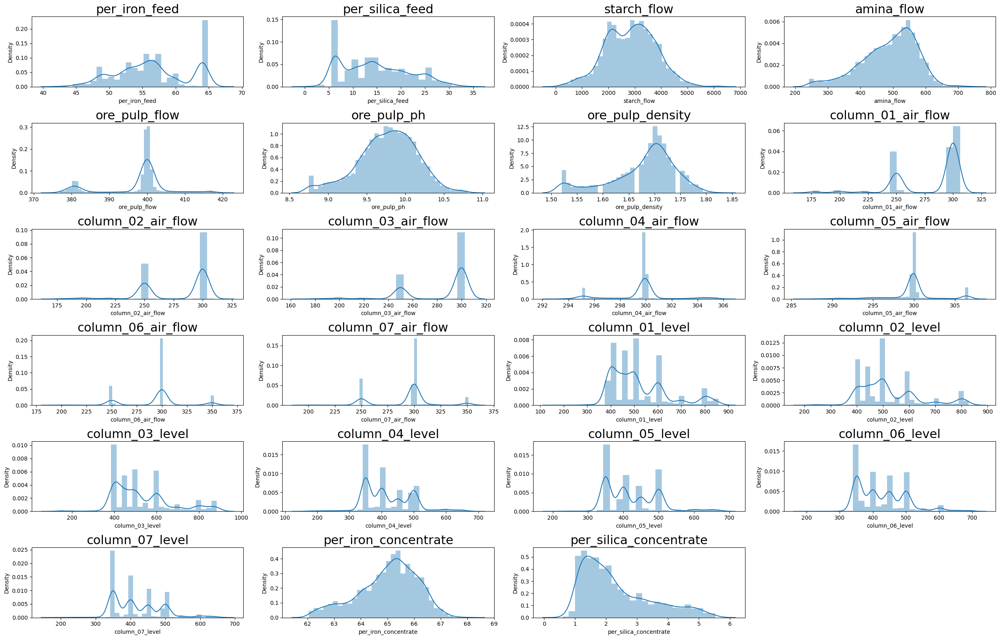

In [20]:
plt.figure(figsize = (25,16))


for index, col in enumerate(df_full.columns):
    plt.subplot(6,4, index + 1)
    plt.title(col,fontsize=22)
    sns.distplot(df_hour[col])
plt.tight_layout()

> Observações:
* A variável target 'per_silica_concentrate' possui uma distribuição assimétrica à esquerda. Isso pode ser facilmente explicado pelo fato da variável representar a % de impureza, que deve ser altamente controlada no processo, desejando sempre ter valores dentro do limite aceitável.

* 'per_iron_concentrate' possui uma distribuição próxima da normal.

Correlação - Distribuição Bivariada - 'per_silica_concentrate' e 'per_iron_concentrate'

Pearson, Spearman e Kendall

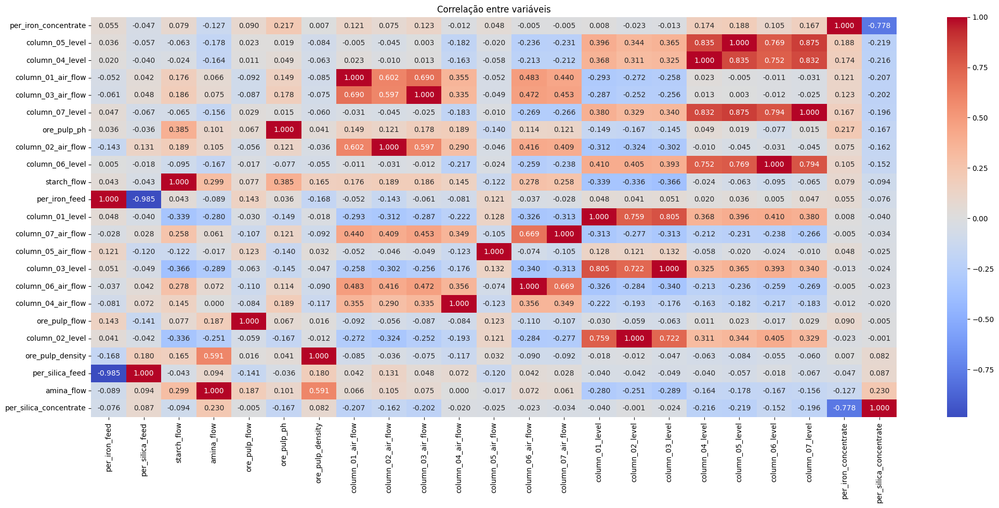

In [31]:
plt.figure(figsize=(25, 10))

sns.heatmap(df_hour.corr(method='spearman').sort_values('per_silica_concentrate'),
            annot = True,
            fmt = '.3f',
            cmap='coolwarm')
plt.title('Correlação entre variáveis')
plt.show()

> Observações:

* Como já era esperado o target não tem forte correlação com as variáveis de entrada e medições de controle, o que nos faz confirmar que o sistema é dinâmico.

* Considerando que a primeira vista a única relação linear existente é entre 'per_silica_concentrate' e 'per_iron_concentrate', o índice de correlação de spearman pode nos dá um resultado melhor para as outras correlações não lineares.

In [66]:
fig = px.scatter(df_hour, x='per_silica_concentrate', y = 'per_iron_concentrate', color='per_silica_concentrate' , size='per_silica_concentrate',
                            hover_name=df_hour.index , trendline="ols")


fig.update_xaxes(title_text="<b> % Silica Concentrate </b>")

fig.update_yaxes(title_text="<b> % Iron Concentrate </b>")

annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.86, y=-0.15,
                              xanchor='center', yanchor='top',
                              text="Data: Quality Prediction in a Mining Process - Kaggle - Eduardo Magalhães ",
                              font=dict(family='Arial',
                                        size=12,
                                        color='rgb(150,150,150)'),
                              showarrow=False))
fig.update_layout(annotations=annotations, title_text=" <b> Correlação entre variáveis: '% Silica Concentrate' x '% Iron Concentrate'",
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> % Sílica Concentrate </b>", showgrid=False,showline=True)
fig.update_yaxes(title_text="<b> % Iron Concentrate </b>", showgrid=False,showline=True)

fig.show()

In [33]:
df_hour.head(1)

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date,,,,,,,,,,,,,,,,,,,,,,,
2017-03-29 19:00:00,59.54,9.56,1913.01,495.24,399.95,9.56,1.67,199.87,195.57,200.05,295.1,306.4,250.01,250.04,855.86,818.48,882.99,559.46,556.97,518.05,523.23,66.28,1.69


In [34]:
fig = px.scatter(df_hour, x='per_silica_concentrate', y = 'amina_flow', color='amina_flow' , size='per_silica_concentrate',
                            hover_name=df_hour.index , trendline="ols")


fig.update_xaxes(title_text="<b> % Silica Concentrate </b>")

fig.update_yaxes(title_text="<b> Amina Flow </b>")

annotations = []
annotations.append(dict(xref='paper', yref='paper', x=0.86, y=-0.15,
                              xanchor='center', yanchor='top',
                              text="Data: Quality Prediction in a Mining Process - Kaggle - Eduardo Magalhães ",
                              font=dict(family='Arial',
                                        size=12,
                                        color='rgb(150,150,150)'),
                              showarrow=False))
fig.update_layout(annotations=annotations, title_text=" <b> Correlação entre variáveis")
fig.show()

In [35]:
df_hour.head()

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
date,,,,,,,,,,,,,,,,,,,,,,,
2017-03-29 19:00:00,59.54,9.56,1913.01,495.24,399.95,9.56,1.67,199.87,195.57,200.05,295.1,306.4,250.01,250.04,855.86,818.48,882.99,559.46,556.97,518.05,523.23,66.28,1.69
2017-03-29 20:00:00,59.54,9.56,2033.82,500.49,400.51,9.28,1.68,199.90,195.38,199.86,295.1,306.4,250.07,250.02,855.70,816.52,883.01,589.51,601.72,549.20,548.97,64.13,1.81
2017-03-29 21:00:00,59.54,9.56,2213.60,530.64,400.36,9.59,1.72,199.88,195.37,199.92,295.1,306.4,250.02,250.21,855.54,814.56,884.39,589.16,603.13,549.18,552.95,65.88,1.71
2017-03-29 22:00:00,59.54,9.56,2004.49,531.89,399.08,9.64,1.73,199.89,196.65,199.91,295.1,306.4,250.03,249.89,855.37,816.51,877.33,580.11,596.83,549.98,544.49,64.69,2.92
2017-03-29 23:00:00,59.54,9.56,1813.14,530.98,400.06,9.59,1.72,199.90,195.33,199.97,295.1,306.4,249.99,250.09,855.21,819.41,882.85,581.98,599.23,551.25,548.53,65.85,2.00


> Observações:
* Pode ser observada também uma correlação linear entre 'per_silica_concentrate' e 'amina_flow', porém com muitos ruídos, o que não nos dá a certeza de linearidade.

* resample 20 minutos

> Observações:

 É possível avaliar a correlação dos valores registrados a cada 20 minutos ou a cada 15 minutos e saber se esses lags são importantes para o target.


1 - dividir as variáveis medidas a cada 20 segundos, registrando a média a cada 15 minutos.
2 - dividir as variáveis medidas a cada 20 segundos, registrando o valor a cada 15 minutos.

In [36]:
# Level
df_full['column_01_02_03_level'] = (df_full['column_01_level'] + df_full['column_02_level']+ df_full['column_03_level']) /3
df_full['column_04_05_level'] = (df_full['column_04_level'] + df_full['column_05_level']) /2
df_full['column_06_07_level'] = (df_full['column_06_level'] + df_full['column_07_level']) /2

In [37]:
# air_flow
df_full['column_01_02_03_air_flow'] = (df_full['column_01_air_flow'] + df_full['column_02_air_flow']+ df_full['column_03_air_flow']) /3
df_full['column_04_05_air_flow'] = (df_full['column_04_air_flow'] + df_full['column_05_air_flow']) /2
df_full['column_06_07_air_flow'] = (df_full['column_06_air_flow'] + df_full['column_07_air_flow']) /2

In [38]:
list_cols = df_full.drop(['per_silica_concentrate', 'per_iron_concentrate', 'per_iron_feed', 'per_silica_feed'], axis=1).columns


#df_20 = df_full.resample("15min").mean()
df_20 = df_full.resample("20min").mean()

df_20 = df_20.drop(['per_iron_concentrate'], axis=1)

#janela = 3
janela = 2

for col_name in list_cols:
    for i in range(janela):
        df_20[f"{col_name} ({-20*(i+1)}mins)"] = df_20[f"{col_name}"].shift(periods=i+1)


In [39]:
df_20 = df_20.drop(list_cols, axis=1).iloc[3:]

In [40]:
df_h = df_20.resample('H').first()

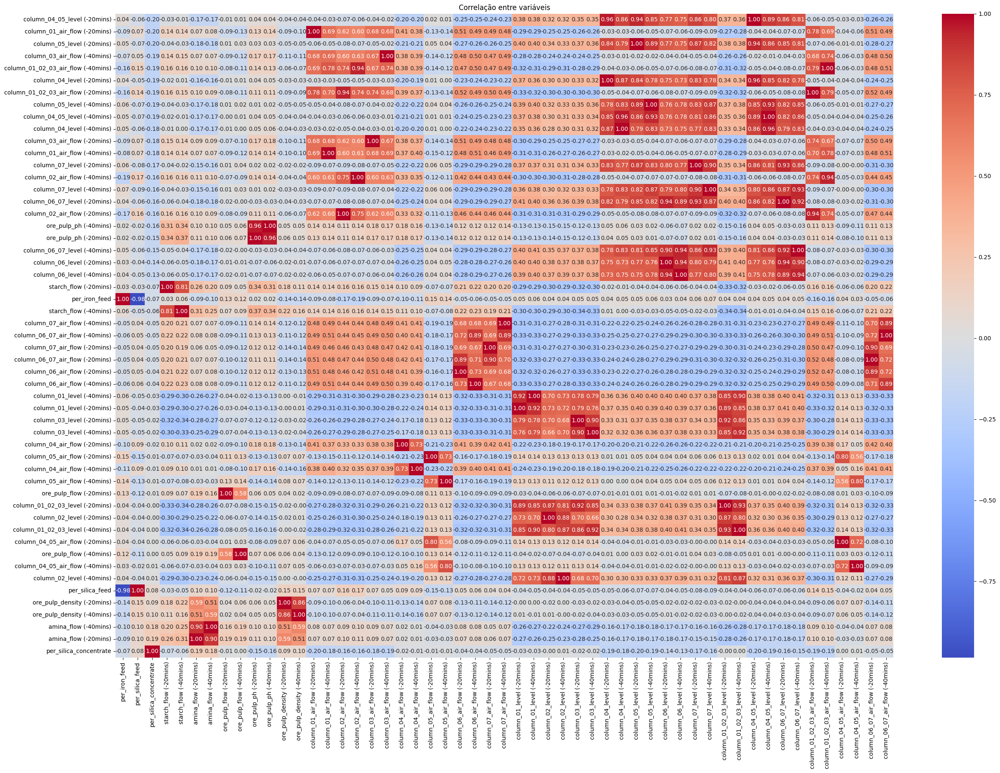

In [41]:
plt.figure(figsize=(30, 20))

sns.heatmap(df_h.corr(method='spearman').sort_values('per_silica_concentrate'),
            annot = True,
            fmt = '.2f',
            cmap='coolwarm')
plt.title('Correlação entre variáveis')
plt.show()

In [42]:
del df_h
del df_20

> Observações:

* Apesar de não ter observado grandes mudanças, acho válido a tentativa de utilizar esses lags para melhorar o desempenho dos modelos.

> Próximo Passo:

* Proponho utilizar esses lags no futuro e montar com as variáveis mais importantes.

* Boxplots
* Column Level Boxplot

In [43]:
scaler = StandardScaler()

#scaler = MinMaxScaler(feature_range=(0,1))

scaled_input = scaler.fit_transform(df_hour)

scaled_input = pd.DataFrame(scaled_input, columns=df_hour.columns, index= df_hour.index)

df_hour_scale = scaled_input

In [44]:
fig = go.Figure()

for col in df_hour_scale:
  fig.add_trace(go.Box(y=df_hour_scale[col].values, name=df_hour_scale[col].name))

fig.update_layout(height=700)
fig.show()


In [57]:
del scaled_input
del df_hour_scale
del scaler


Feed

> Observações:

* Optamos nesta primeira etapa não fazer nenhuma limpeza de outliers, pois consideramos que os valores identificados fazem parte da dinâmica do dado.

> Proximo Passo:

* Iremos classificar o target a fim de analisar algumas correlações. Essa classificação pode ser usada para dividir os dados no futuro.
* Levando em consideração que 2 % de sílica é um valor aceitável para a maioria das indústrias. Vamos partir deste ponto e considerar esse valor a nossa "linha de corte".

### 1.1.3 Ruídos

* Nesta seção iremos analisar algumas variáveis que apresentam picos e vales acentuados e repentinos nos dados. Com alta variação dos valores no tempo.

#### 1.1.3.1 Air Flow

In [46]:
df_hour_scale.columns

Index(['per_iron_feed', 'per_silica_feed', 'starch_flow', 'amina_flow',
       'ore_pulp_flow', 'ore_pulp_ph', 'ore_pulp_density',
       'column_01_air_flow', 'column_02_air_flow', 'column_03_air_flow',
       'column_04_air_flow', 'column_05_air_flow', 'column_06_air_flow',
       'column_07_air_flow', 'column_01_level', 'column_02_level',
       'column_03_level', 'column_04_level', 'column_05_level',
       'column_06_level', 'column_07_level', 'per_iron_concentrate',
       'per_silica_concentrate'],
      dtype='object')

In [47]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_01_air_flow'], name='Célula 01 - Fluxo de ar', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_02_air_flow'], name='Célula 02 - Fluxo de ar', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_03_air_flow'], name='Célula 03 - Fluxo de ar', mode='lines+markers')
)

fig.update_layout(title = 'Air FLow - Células de Flotação 01 | 02 | 03', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)

fig.show()

In [48]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_04_air_flow'], name='Célula 04 - Fluxo de ar', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_05_air_flow'], name='Célula 05 - Fluxo de ar', mode='lines+markers')
)

#fig.add_trace(
    #go.Scatter(x=df_hour.index, y=df_hour['per_silica_concentrate'], name='silica', mode='lines+markers')
#)


fig.update_layout(title = 'Air FLow - Células de Flotação 04 | 05', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)

fig.show()

In [49]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_06_air_flow'], name='Célula 06 - Fluxo de ar', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_07_air_flow'], name='Célula 07 - Fluxo de ar', mode='lines+markers')
)

fig.update_layout(title = 'Air FLow - Células de Flotação 06 | 07', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>")

fig.show()

#### 1.1.3.2 level

In [50]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_01_level'], name='Célula 01 - Nível', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_02_level'], name='Célula 02 - Nível', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_03_level'], name='Célula 03 - Nível', mode='lines+markers')
)

fig.update_layout(title = 'Level - Células de Flotação 01 | 02 | 03', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)


fig.show()

In [51]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_04_level'], name='Célula 04 - Nível', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_05_level'], name='Célula 05 - Nível', mode='lines+markers')
)

fig.update_layout(title = 'Level - Células de Flotação 04 | 05', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)

fig.show()

In [52]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_06_level'], name='Célula 06 - Nível', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['column_07_level'], name='Célula 07 - Nível', mode='lines+markers')
)

fig.update_layout(title = 'Level - Células de Flotação 06 | 07', height=300,
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False)
fig.update_yaxes(title_text="<b> mm </b>", showgrid=False)

fig.show()

> Observação:
* Como já suspeitado anteriormente e validado com os gráficos acima, existe alta correlação entre as Colunas de flotação.

> Próximos Passos:

* Iremos calcular as médias entre as colunas com alta correlação e utilizá-las nos modelos.
* Vamos calcular as médias utilizando o dataset full e depois testando com o dataset horário.

* Médias das colunas

In [53]:
# Level
df_hour['column_01_02_03_level'] = (df_hour['column_01_level'] + df_hour['column_02_level']+ df_hour['column_03_level']) /3
df_hour['column_04_05_level'] = (df_hour['column_04_level'] + df_hour['column_05_level']) /2
df_hour['column_06_07_level'] = (df_hour['column_06_level'] + df_hour['column_07_level']) /2
# air_flow
df_hour['column_01_02_03_air_flow'] = (df_hour['column_01_air_flow'] + df_hour['column_02_air_flow']+ df_hour['column_03_air_flow']) /3
df_hour['column_04_05_air_flow'] = (df_hour['column_04_air_flow'] + df_hour['column_05_air_flow']) /2
df_hour['column_06_07_air_flow'] = (df_hour['column_06_air_flow'] + df_hour['column_07_air_flow']) /2

## 1.2 Time Serie EDA

> Observações:
* Nesta seção iremos analisar especialmente as 2 variáveis de saída.

> Teoria necessária:

* Tendência: Média variante ao longo do tempo. É a direção geral de onde alguma coisa está evoluindo ao decorrer do tempo. Pode ser negativa ou positiva.
* Sazonalidade: Variações em períodos específicos. São oscilações que podem ser recorrente ou se repetem em um determinado período de tempo específico.

Decomposição da série temporal - % Sílica Concentrate

In [33]:
resultado = seasonal_decompose(df_hour['per_silica_concentrate'], period=24)

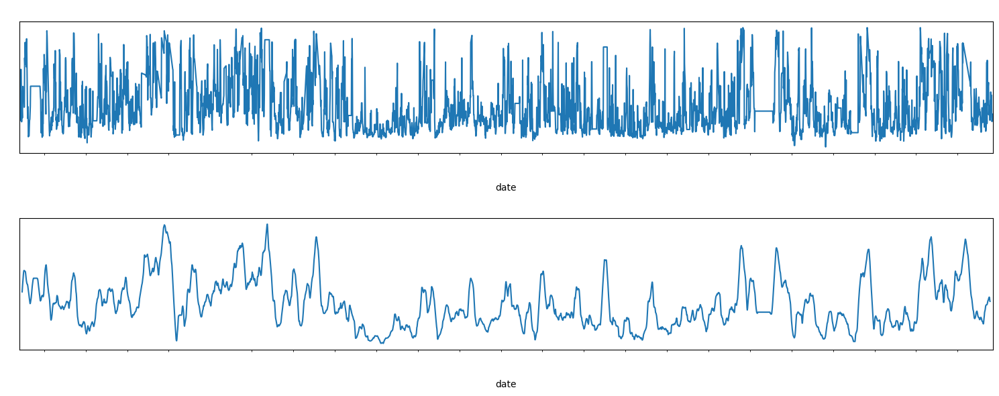

In [42]:

#Plotar em tamanho maior

fig, (ax1,ax2) = plt.subplots(2,1, figsize=(15,6))
resultado.observed.plot(ax=ax1, title = 'Valores Observados')
resultado.trend.plot(ax=ax2, title = 'Tendência da Série Temporal')


plt.tight_layout()
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
ax2.tick_params(axis='x', colors='white')
ax2.tick_params(axis='y', colors='white')
ax1.title.set_color('white')
ax2.title.set_color('white')
#plt.savefig('Decomposição.png', transparent=True)

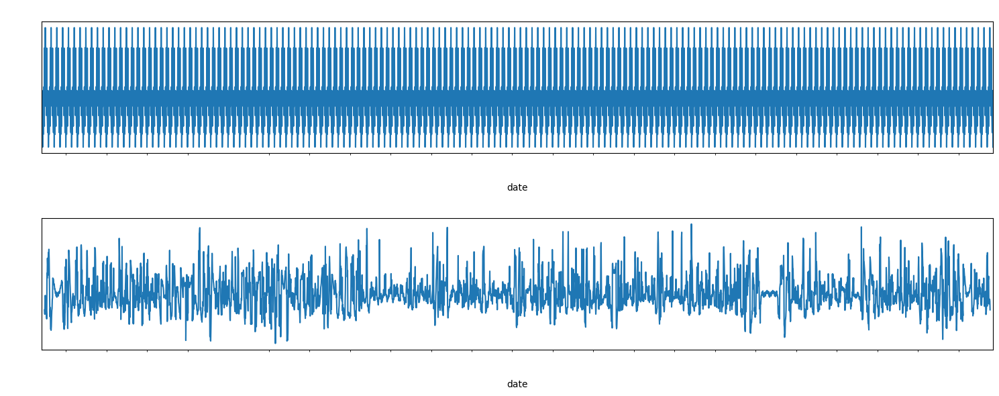

In [41]:
fig, (ax1,ax2) = plt.subplots(2,1, figsize=(15,6))
resultado.seasonal.plot(ax=ax1, title = 'Sazonalidade')
resultado.resid.plot(ax=ax2, title = 'Resíduo')


plt.tight_layout()
ax1.tick_params(axis='x', colors='white')
ax1.tick_params(axis='y', colors='white')
ax2.tick_params(axis='x', colors='white')
ax2.tick_params(axis='y', colors='white')
ax1.title.set_color('white')
ax2.title.set_color('white')
# plt.savefig('Decomposição.png', transparent=True)

[]

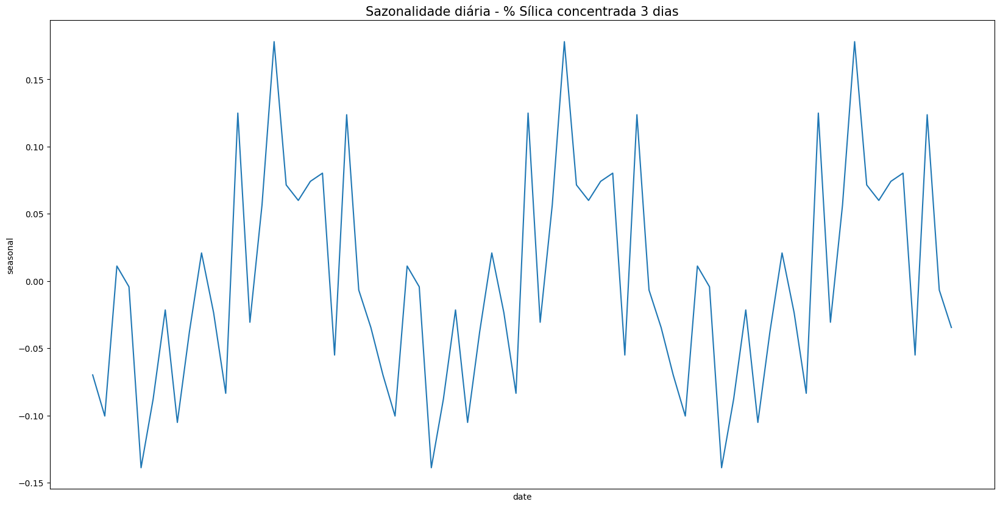

In [40]:
# plotando a sazonalidade para um período de 3 dias
ax = sns.lineplot(data=resultado.seasonal[:72])
ax.figure.set_size_inches(20, 10)
ax.set_title('Sazonalidade diária - % Sílica concentrada 3 dias', loc='center', fontsize=15)
ax.set_xticks(novo_index[:72])
ax.set_xticklabels(ax.get_xticks(), rotation = 45)

ax.plot()

> Observações:

* Analisando os dados diários, é possível identificar que a série parece ser estacionária, porém a análise visual não é segura e determinante, teremos que investigar ainda mais.

> Próximos Passos:

* Teste: Augmented Dickey-Fuller tese e  KPSS test.

* **Dickey-Fuller teste:** esse é um dos testes estatísticos para verificar Estacionaridade. Aqui, a hipótese nula é que o TS é não-estacionária. Os resultados do teste são compostos por uma estatística de teste e alguns valores críticos para os níveis de confiança da diferença. Se o ‘teste estatístico’ é menor do que o “valor crítico”, podemos rejeitar a hipótese nula e dizer que a série é estacionária.

* **Teste KPSS:** surge como uma forma a diminuir a incerteza do teste ADF. A hipótese nula do teste estabelece que a série seja estacionária, logo não possui raiz unitária. Diferentemente aos testes de Dickey-Fuller.

Dickey-Fuller teste

In [ ]:
def test_adf(series, title=''):
    dfout={}
    dftest=sm.tsa.adfuller(series.dropna(), autolag='AIC', regression='ct')
    for key,val in dftest[4].items():
        dfout[f'critical value ({key})']=val
    if dftest[1]<=0.05:
        print("Strong evidence against Null Hypothesis")
        print("Reject Null Hypothesis - Data is Stationary")
        print("Data is Stationary", title)
    else:
        print("Strong evidence for  Null Hypothesis")
        print("Accept Null Hypothesis - Data is not Stationary")
        print("Data is NOT Stationary for", title)


def test_stationarity(timeseries):
    # Perform Dickey-Fuller test:
    print('Results of Dickey-Fuller Test:')
    dftest = adfuller(timeseries,maxlag=7*4, autolag='AIC')
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (round(dfoutput,3))

In [ ]:
test_adf(df_hour['per_silica_concentrate'], "per_silica_concentrate")

Strong evidence against Null Hypothesis
Reject Null Hypothesis - Data is Stationary
Data is Stationary per_silica_concentrate


In [ ]:
test_stationarity(df_hour['per_silica_concentrate'])

Results of Dickey-Fuller Test:
Test Statistic                   -7.776
p-value                           0.000
#Lags Used                       24.000
Number of Observations Used    3916.000
Critical Value (1%)              -3.432
Critical Value (5%)              -2.862
Critical Value (10%)             -2.567
dtype: float64


Teste KPSS

In [ ]:
pvalue_kpss = kpss(x=df_hour['per_silica_concentrate'], regression='ct')[1]

print(pvalue_kpss)

0.01


# 2. Conclusão

## 2.1 Insights

In [43]:
df_hour['week'] = df_hour.index.week

df_hour.head(1)

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate,week
date,,,,,,,,,,,,,,,,,,,,,,,,
2017-03-29 19:00:00,59.54,9.56,1913.01,495.24,399.95,9.56,1.67,199.87,195.57,200.05,295.1,306.4,250.01,250.04,855.86,818.48,882.99,559.46,556.97,518.05,523.23,66.28,1.69,13


* Média semanal - Eficiência do processo de flotação

In [44]:
df_efc_week = df_hour.groupby(['week'], as_index=False)['per_iron_feed', 'per_iron_concentrate', 
                                          'per_silica_feed', 'per_silica_concentrate'].mean()
df_efc_week['iron_efc'] = (df_efc_week['per_iron_concentrate'] / df_efc_week['per_iron_feed']) * 100

df_efc_week['silica_efc'] = (1 - df_efc_week['per_silica_concentrate'] / df_efc_week['per_silica_feed']) * 100

df_efc_week = df_efc_week.round(2)
df_efc_week

,week,per_iron_feed,per_iron_concentrate,per_silica_feed,per_silica_concentrate,iron_efc,silica_efc
0,13,59.48,64.84,9.98,2.78,109.03,72.19
1,14,55.72,65.11,14.83,2.40,116.86,83.85
2,15,54.37,65.06,16.76,2.33,119.66,86.08
3,16,54.72,64.21,15.48,3.22,117.33,79.18
4,17,54.00,65.10,18.24,2.55,120.55,86.02
5,18,54.84,64.66,17.10,3.13,117.90,81.67
6,19,56.77,64.73,15.04,2.89,114.03,80.80
7,20,64.03,64.34,6.26,2.71,100.49,56.71
8,21,64.03,65.47,6.26,1.75,102.24,72.11
9,22,64.03,65.99,6.26,1.49,103.07,76.20


* Eficiência de separação da Sílica = (1 - % de sílica no concentrado / % de sílica na alimentação) x 100%

In [45]:
df_efc_week['iron_efc'].mean()

116.16875

In [82]:
df_efc_week['silica_efc'].mean()

81.765

In [65]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_efc_week['week'], y=df_efc_week['iron_efc'], name='Eficiência Ferro', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_efc_week['week'], y=df_efc_week['silica_efc'], name='Eficiência Silica', mode='lines+markers')
)

fig.update_layout(title = 'Eficiência semanal da Separação da Sílica X Eficiência na Recuperação do Ferro',paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Semana </b>", showgrid=False,showline=True)
fig.update_yaxes(title_text="<b> % </b>", showgrid=False,showline=True)


fig.show()

In [69]:
df_hour['iron_efc'] = (df_hour['per_iron_concentrate'] / df_hour['per_iron_feed']) * 100

df_hour['silica_efc'] = (1 - df_hour['per_silica_concentrate'] / df_hour['per_silica_feed']) * 100

In [75]:
# Create fig

fig = go.Figure()

# Add traces
fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['iron_efc'], name='Eficiência Ferro', mode='lines+markers')
)

fig.add_trace(
    go.Scatter(x=df_hour.index, y=df_hour['silica_efc'], name='Eficiência Silica', mode='lines+markers')
)

fig.update_layout(title = 'Eficiência da Separação da Sílica X Eficiência na Recuperação do Ferro',
                  paper_bgcolor='rgba(0,0,0,0)',plot_bgcolor='rgba(0,0,0,0)', font_color="White")

# Set x and y-axis title
fig.update_xaxes(title_text="<b> Date </b>", showgrid=False,showline=True)
fig.update_yaxes(title_text="<b> % </b>", showgrid=False,showline=True)


fig.show()

In [92]:
df_hour.loc[df_hour['iron_efc'] > 151]

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate,week,iron_efc,silica_efc
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2017-07-21 03:00:00,43.37,32.23,4539.67,578.91,401.38,10.52,1.71,299.93,300.07,299.90,299.94,299.99,299.88,299.90,400.74,397.69,400.17,399.50,395.47,399.28,399.43,66.57,1.51,29,153.493198,95.314924
2017-07-21 04:00:00,43.37,32.23,4089.22,585.01,400.26,9.98,1.71,299.92,299.99,299.97,300.06,299.92,299.36,300.03,400.39,402.44,400.22,399.39,400.98,399.85,398.71,66.01,1.46,29,152.201983,95.470059
2017-07-21 05:00:00,43.37,32.23,3880.35,571.05,399.16,10.03,1.71,303.35,300.14,300.10,299.98,300.23,300.70,300.15,399.77,401.31,400.14,400.41,397.50,399.30,398.92,65.76,2.41,29,151.625548,92.522495
2017-07-21 06:00:00,43.37,32.23,3949.35,580.77,400.31,10.00,1.74,300.13,300.07,299.98,299.98,299.45,300.48,300.11,399.36,399.86,399.19,399.45,399.82,400.11,400.02,66.28,1.27,29,152.824533,96.059572
2017-09-06 07:00:00,42.74,33.40,2332.60,536.56,394.13,9.53,1.67,299.42,298.33,299.83,296.67,303.00,300.13,300.11,399.02,420.62,395.27,342.26,345.40,352.08,345.86,65.08,2.59,36,152.269537,92.245509
2017-09-06 08:00:00,42.74,33.40,2902.32,458.17,381.08,9.38,1.65,297.39,300.53,299.85,296.85,303.04,321.97,308.08,467.43,611.73,622.12,369.21,355.34,371.26,385.92,65.67,1.64,36,153.649977,95.089820
2017-09-06 09:00:00,42.74,33.40,3358.66,606.13,398.72,9.55,1.74,303.68,299.94,300.04,297.04,303.07,349.26,295.17,400.42,599.02,398.25,350.88,345.99,351.73,346.71,65.16,1.83,36,152.456715,94.520958
2017-09-06 10:00:00,42.74,33.40,2409.89,548.72,409.52,9.63,1.67,299.87,300.34,299.91,297.22,303.11,349.14,293.51,399.55,599.75,399.93,352.04,350.39,351.17,351.28,65.04,1.82,36,152.175948,94.550898
2017-09-06 11:00:00,42.74,33.40,2364.49,487.83,399.79,9.56,1.62,299.94,299.83,299.99,297.40,303.15,349.69,306.24,400.29,600.45,399.35,349.17,348.98,351.91,348.46,65.35,1.73,36,152.901263,94.820359


In [84]:
df_hour['iron_efc'].describe()

count    3941.000000
mean      116.685572
std        11.119805
min        97.079494
25%       108.534756
50%       116.001394
75%       123.390925
max       154.515676
Name: iron_efc, dtype: float64

In [ ]:
df_hour.loc[df_hour['per_silica_concentrate'] <= 4].describe()

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate,week
count,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000,3491.000000
mean,56.369702,14.555815,2866.401186,486.681421,397.517419,9.786142,1.679714,282.878731,279.342214,283.807425,299.598980,299.673437,293.953595,292.708817,519.451094,521.935551,531.734744,420.219441,425.836445,428.812326,420.233228,65.246800,2.023635,24.703237
std,5.264078,6.902081,938.432886,82.557259,8.457865,0.370487,0.062157,27.915363,28.683176,26.984900,2.284272,3.111902,28.142667,26.115860,121.040835,115.281230,138.029043,75.567921,74.564096,73.349791,70.758364,0.947547,0.780405,6.678850
min,42.740000,1.310000,116.640000,242.930000,376.840000,8.750000,1.520000,175.890000,178.190000,177.200000,293.340000,287.060000,196.510000,199.730000,181.930000,224.910000,135.210000,165.730000,214.740000,203.700000,188.940000,62.050000,0.600000,13.000000
25%,52.610000,8.450000,2169.630000,434.510000,398.820000,9.560000,1.650000,250.140000,250.150000,250.150000,299.810000,299.670000,299.255000,299.110000,408.270000,449.155000,403.395000,351.735000,351.185000,354.710000,351.170000,64.720000,1.390000,19.000000
50%,56.090000,13.540000,2894.060000,500.020000,399.850000,9.810000,1.690000,299.860000,299.640000,299.900000,299.920000,299.910000,299.890000,299.880000,499.670000,499.880000,499.650000,401.250000,401.150000,406.530000,400.910000,65.310000,1.850000,25.000000
75%,59.810000,19.940000,3514.345000,548.080000,400.600000,10.040000,1.720000,299.960000,300.000000,299.950000,299.990000,300.090000,300.110000,300.130000,599.835000,599.300000,600.290000,496.835000,498.175000,497.500000,458.405000,65.920000,2.490000,30.000000
max,65.780000,33.400000,6270.160000,736.500000,418.070000,10.810000,1.820000,312.300000,309.890000,302.780000,305.600000,307.010000,354.980000,351.270000,859.030000,827.780000,884.830000,675.630000,674.070000,698.510000,655.500000,68.010000,4.000000,36.000000


In [ ]:
df_hour.loc[(df_hour['per_silica_concentrate'] >=2)].describe()

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate,week
count,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000,1977.000000
mean,55.766904,15.281624,2754.247779,503.001022,397.461437,9.721492,1.682731,275.773505,273.452974,277.096449,299.657749,299.533647,293.287521,291.468306,521.240283,526.848103,534.027749,403.879454,409.129889,418.007137,405.572104,64.339727,3.183429,23.954476
std,4.833411,6.535387,977.101494,82.551978,8.712394,0.382924,0.065576,32.525147,31.282903,30.965010,2.558383,3.440605,32.380358,29.797181,131.262806,121.250674,146.704744,73.103560,70.265963,75.671474,68.418371,1.002585,0.964518,7.288027
min,42.740000,2.770000,54.600000,242.930000,376.840000,8.750000,1.520000,175.890000,179.030000,180.350000,293.340000,287.060000,196.510000,199.730000,181.930000,233.230000,135.690000,165.730000,214.740000,217.940000,185.060000,62.050000,2.000000,13.000000
25%,52.670000,10.800000,2046.160000,457.300000,398.640000,9.490000,1.650000,250.050000,250.010000,250.070000,299.720000,299.430000,251.250000,250.880000,405.180000,449.200000,401.190000,350.460000,350.220000,351.550000,350.050000,63.640000,2.320000,17.000000
50%,55.640000,14.530000,2736.600000,521.210000,399.800000,9.740000,1.700000,299.790000,299.080000,299.870000,299.920000,299.900000,299.890000,299.870000,489.410000,499.570000,498.880000,398.100000,398.710000,400.110000,398.220000,64.450000,2.990000,24.000000
75%,57.540000,20.240000,3480.920000,558.560000,400.550000,9.990000,1.730000,299.930000,299.960000,299.940000,300.000000,300.090000,300.200000,300.190000,599.970000,599.550000,600.440000,450.140000,450.460000,454.100000,449.920000,65.110000,3.880000,31.000000
max,64.480000,33.400000,6270.160000,736.980000,418.070000,10.810000,1.820000,312.060000,309.890000,302.780000,305.600000,307.010000,354.980000,351.270000,859.030000,827.780000,884.580000,656.030000,671.890000,693.680000,634.820000,66.890000,5.530000,36.000000


In [ ]:
df_hour.corr(method='spearman').sort_values('per_silica_concentrate')

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
per_iron_concentrate,0.054837,-0.047385,0.078630,-0.126589,0.090055,0.217099,0.007097,0.120751,0.074516,0.123082,-0.012315,0.047991,-0.004840,-0.005292,0.007625,-0.023117,-0.013310,0.174449,0.187658,0.104548,0.166921,1.000000,-0.778010
column_05_level,0.036280,-0.056911,-0.062992,-0.178429,0.022909,0.018823,-0.083901,-0.005442,-0.045008,0.002824,-0.182479,-0.019561,-0.236106,-0.230986,0.396354,0.343760,0.365257,0.834599,1.000000,0.768661,0.875109,0.187658,-0.219350
column_04_level,0.019771,-0.039974,-0.023590,-0.164195,0.011369,0.048731,-0.062570,0.023431,-0.010291,0.012892,-0.162672,-0.057799,-0.213386,-0.212203,0.367821,0.310861,0.325458,1.000000,0.834599,0.752006,0.831900,0.174449,-0.215601
column_01_air_flow,-0.052051,0.041970,0.175880,0.066095,-0.092345,0.149328,-0.085383,1.000000,0.601911,0.689812,0.354928,-0.051572,0.482972,0.439623,-0.292837,-0.271825,-0.257617,0.023431,-0.005442,-0.011303,-0.030656,0.120751,-0.207114
column_03_air_flow,-0.061011,0.048176,0.185891,0.075259,-0.086503,0.177851,-0.074995,0.689812,0.596528,1.000000,0.335383,-0.048579,0.472497,0.452517,-0.286661,-0.251685,-0.255903,0.012892,0.002824,-0.011727,-0.024807,0.123082,-0.202235
column_07_level,0.047471,-0.067366,-0.065259,-0.155741,0.029320,0.014734,-0.060470,-0.030656,-0.044719,-0.024807,-0.182618,-0.010399,-0.268878,-0.265703,0.380332,0.329444,0.339867,0.831900,0.875109,0.794011,1.000000,0.166921,-0.196168
ore_pulp_ph,0.036400,-0.036259,0.384926,0.101145,0.067471,1.000000,0.040981,0.149328,0.121303,0.177851,0.188629,-0.139788,0.113542,0.121258,-0.148729,-0.166568,-0.145388,0.048731,0.018823,-0.076646,0.014734,0.217099,-0.166523
column_02_air_flow,-0.143376,0.130615,0.189061,0.105044,-0.056355,0.121303,-0.035630,0.601911,1.000000,0.596528,0.289782,-0.046494,0.415583,0.408935,-0.311761,-0.323745,-0.301824,-0.010291,-0.045008,-0.030719,-0.044719,0.074516,-0.161977
column_06_level,0.004761,-0.018479,-0.095010,-0.167340,-0.017452,-0.076646,-0.054764,-0.011303,-0.030719,-0.011727,-0.217040,-0.023885,-0.258919,-0.238061,0.410250,0.404918,0.392677,0.752006,0.768661,1.000000,0.794011,0.104548,-0.152046
starch_flow,0.042520,-0.042753,1.000000,0.298685,0.077061,0.384926,0.164555,0.175880,0.189061,0.185891,0.144916,-0.122275,0.277820,0.258290,-0.339340,-0.336239,-0.366498,-0.023590,-0.062992,-0.095010,-0.065259,0.078630,-0.093556


In [ ]:
df_hour.columns

Index(['per_iron_feed', 'per_silica_feed', 'starch_flow', 'amina_flow',
       'ore_pulp_flow', 'ore_pulp_ph', 'ore_pulp_density',
       'column_01_air_flow', 'column_02_air_flow', 'column_03_air_flow',
       'column_04_air_flow', 'column_05_air_flow', 'column_06_air_flow',
       'column_07_air_flow', 'column_01_level', 'column_02_level',
       'column_03_level', 'column_04_level', 'column_05_level',
       'column_06_level', 'column_07_level', 'per_iron_concentrate',
       'per_silica_concentrate'],
      dtype='object')

In [ ]:
df_hour.corr(method='spearman').loc[:,'per_silica_concentrate']

per_iron_feed            -0.076203
per_silica_feed           0.087248
starch_flow              -0.093556
amina_flow                0.230104
ore_pulp_flow            -0.005386
ore_pulp_ph              -0.166523
ore_pulp_density          0.081682
column_01_air_flow       -0.207114
column_02_air_flow       -0.161977
column_03_air_flow       -0.202235
column_04_air_flow       -0.020174
column_05_air_flow       -0.025208
column_06_air_flow       -0.022799
column_07_air_flow       -0.033653
column_01_level          -0.039553
column_02_level          -0.001442
column_03_level          -0.024337
column_04_level          -0.215601
column_05_level          -0.219350
column_06_level          -0.152046
column_07_level          -0.196168
per_iron_concentrate     -0.778010
per_silica_concentrate    1.000000
Name: per_silica_concentrate, dtype: float64

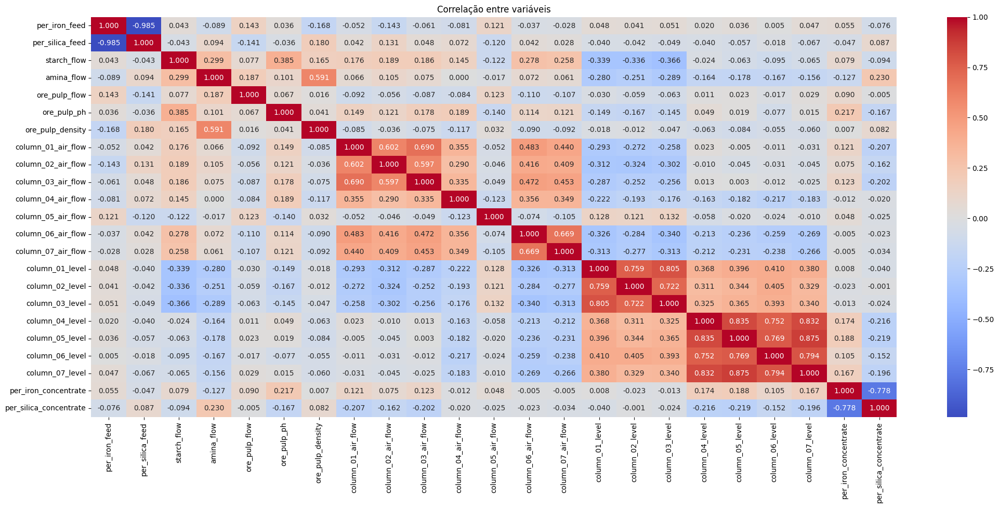

In [ ]:
plt.figure(figsize=(25, 10))

sns.heatmap(df_hour.corr(method='spearman'),
            annot = True,
            fmt = '.3f',
            cmap='coolwarm')
plt.title('Correlação entre variáveis')
plt.show()




* RESUMO FINAL

> Período de dados: 

* 29/03/2017 a 09/09/2017

> Periodicidade: 

* Horária

> Periodicidade das medições:

* 'per_iron_feed', 'per_silica_feed' - > 3 vezes ao dia - 01, 07, 16 horas;
* 'per_iron_concentrate', 'per_silica_concentrate' - > A cada 1 hora - 00h;
* Starch Flow', 'Amina Flow', 'Ore_pulp_Flow', 'Ore_pulp_pH', 'ore_pulp_density', column_X_air_flow, column_X_level -> A cada 20 segundos.

> Insights

* Analisando os subplots das variáveis, foi possível identificar:
    * Descontinuidade no período entre 17/03/2017 a 29/03/2017;
    * Diferentes Periodicidades;
    * Possível interpolação e/ou preenchimento de dados faltantes em algumas variáveis;
    * 'per_iron_feed', 'per_silica_feed' tem grandes períodos com repetição de valores únicos, o que deixa um questionamento sobre como a alimentação do minério funciona.

* A média do percentual de Sílica (per_silica_feed) é de 14.66% enquanto o percentual do concentrado de sílica resultante do processo (per_silica_concentrate) é de 2.33%, uma queda considerável de teor de SiO2(12.3%), o valor médio de per_silica_concentrate está bem próximo dos padrões de teor de SiO2 exigidos por grandes empresas para produção de aço por exemplo. Porém é possível notar que a dinâmica do processo tem o objetivo de manter o teor de SiO2 aproximadamente abaixo dos 5 %(valor máximo do concentrado final).

* A média da % de ferro alimentado(per iron feed) foi de aproximadamente 56.3% enquanto que o % de ferro resultante(per iron concentrate) foi de 65.0%, um ganho de 8.7% no concentrado de ferro no final do processo.
* A variável target varia de 0.6 a 5.5 e tem um desvio padrão de 1.12. a diferença da média e mediana é de 3.22.
* As variáveis de Air Flow e Level apresentam em geral um desvio padrão alto, com exceção de Flotation column_04_air_flow e column_05_air_flow. Porém os desvios das variáveis de Air flow são em geral bem menores que os valores de desvios de Level. Os valores de desvio padrão indicam alta dispersão de dados em relação a média.

* Eficiência média do período:

        - Índice de Concentração de Ferro (Fe): Esse índice é calculado dividindo-se a concentração de ferro no produto final pela concentração de ferro no minério bruto e multiplicando-se por 100.
        - Índice de Concentração de Ferro médio do período foi de aproximadamente 116.1 %

* Vazão de massa : A vazão mássica é a quantidade de massa de sólidos que está sendo transportada pela polpa em um determinado intervalo de tempo. Pode ser calculada multiplicando as variáveis ore_pulp_flow e ore_pulp_density e é medida em t/h.

        - A vazão mássica média do período é de 675.92 t/h de minério.


* O resample do dataset para dados horários, trouxe uma "limpeza", deixando a série mais clara e revelando padrões de comportamento, como o caso da Column_02_air_flow e ore_pulp_flow, etc. Acredito que utilizar os dados horários e realizar uma média do período foi a escolha certa.


> Importante:

* Considerando os dados das colunas, podemos formular algumas hipóteses a serem discutidas com o analista/ responsável, conhecedor do processo industrial:

    * O padrão identificado nos faz pensar que o sistema funciona com 7 colunas de flotação, conectadas em paralelo seguindo um desenho:
    01 <-> 02 <-> 03
    04 <-> 05
    06 <-> 07

* Quais os métodos utilizado nas medições de % Iron feed e % Silica Feed(Já que a obtenção da % de Ferro no minério é um método demorado e caro, é importante saber se foi utilizado  método de  técnica gravimétrica) ?

* Qual a porcentagem de ferro e sílica que são admitidos no processo final ?

* A variável target 'per_silica_concentrate' possui uma distribuição assimétrica à esquerda. Isso pode ser facilmente explicado pelo fato da variável representar a % de impureza, que deve ser altamente controlada no processo, desejando sempre ter valores dentro do limite aceitável.

* 'per_iron_concentrate' possui uma distribuição próxima da normal.

* A série temporal de % silica concentrada é estacionária.

> Observações:

* Após essa primeira análise exploratória iremos exportar o dataset bruto e por hora.
* A próxima etapa será de modelagem dos dados, e iremos dividir em 2 abordagens:
        - 1º Regressão com divisão ramdômica dos dados.
        - 2º Série temporal considerando dados contínuos. 

In [1]:
# df_hour.to_csv('./Dataset/df_hour.csv', encoding='utf-8', sep=',')

In [ ]:
df_hour.shape

(3941, 23)

In [ ]:
df_hour.describe().round(1).loc[['max', 'mean','50%', 'min', 'std'],:]

,per_iron_feed,per_silica_feed,starch_flow,amina_flow,ore_pulp_flow,ore_pulp_ph,ore_pulp_density,column_01_air_flow,column_02_air_flow,column_03_air_flow,column_04_air_flow,column_05_air_flow,column_06_air_flow,column_07_air_flow,column_01_level,column_02_level,column_03_level,column_04_level,column_05_level,column_06_level,column_07_level,per_iron_concentrate,per_silica_concentrate
max,65.8,33.4,6270.2,737.0,418.1,10.8,1.8,312.3,309.9,302.8,305.6,307.0,355.0,351.3,859.0,827.8,884.8,675.6,674.1,698.5,655.5,68.0,5.5
mean,56.2,14.8,2849.6,488.9,397.5,9.8,1.7,281.4,278.3,282.4,299.6,299.7,293.7,292.4,519.9,522.7,531.6,418.1,422.7,426.9,418.1,65.0,2.3
50%,55.9,14.2,2883.7,502.8,399.8,9.8,1.7,299.8,299.6,299.9,299.9,299.9,299.9,299.9,499.6,499.8,499.6,400.8,400.6,402.7,400.5,65.2,2.0
min,42.7,1.3,54.6,242.9,376.8,8.8,1.5,175.9,178.2,177.2,293.3,287.1,196.5,199.7,181.9,224.9,135.2,165.7,214.7,203.7,185.1,62.0,0.6
std,5.2,6.9,947.7,83.7,8.5,0.4,0.1,29.2,29.3,28.1,2.3,3.1,28.9,26.5,123.1,116.3,139.9,76.2,74.7,74.8,71.7,1.1,1.1


<img src="./imagens/Resumo.png"/>

# 3. Referências

> Machine Learning-based Quality Prediction in the Froth Flotation Process of Mining

        - https://www.diva-portal.org/smash/get/diva2:1386720/FULLTEXT01.pdf

> Dickey-Fuller Test e KPSS

        -http://www2.reitoria.uri.br/~vivencias/Numero_025/artigos/pdf/Artigo_05.pdf

> Teor de Ferro e Sílica no ferro:

        - https://www.preparaenem.com/quimica/producao-ferro.htm
        - https://sistemas.anm.gov.br/publicacao/mostra_imagem.asp?idbancoarquivoarquivo=3974

> Cyclical-features:

        - https://medium.com/towards-data-science/cyclical-features-encoding-its-about-time-ce23581845ca